# House Prices - Regression

Kaggle competition link: https://www.kaggle.com/competitions/house-prices-advanced-regression-techniques/

In [2]:
# Essential libraries for data manipulation
import numpy as np #linear algebra
import pandas as pd # data processing

import matplotlib.pyplot as plt # graph plots
import seaborn as sns # plots
%matplotlib inline


# basic styling for graphs
plt.style.use('ggplot')

font = {"family": "Azeret Mono",
"weight": "bold",
"size": 14}

plt.rcParams.update({"font.family": font["family"], "font.weight": font["weight"], "font.size": font["size"]})

# loads data train
df_train = pd.read_csv("data/02_house_prices/train.csv")
df_test = pd.read_csv("data/02_house_prices/test.csv")

# prepare path to save model results for comparision
results = "output/house_regression.csv"

# take a look at the data
print(f"Data shape - train: {df_train.shape}")
print(f"Data shape - test: {df_test.shape}")

df_train.head()

Data shape - train: (1460, 81)
Data shape - test: (1459, 80)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


## 1. Data Exploration

*Note: A reference guide on extensive data exploration: https://www.kaggle.com/code/pmarcelino/comprehensive-data-exploration-with-python*



In [3]:
# Checking the descriptive stats
df_train.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [4]:
# check data type and null values
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [5]:
# Inspecting the SalesPrice, the variable we will predict for df_test
df_train["SalePrice"].describe()



count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

/var/folders/r9/ggpr596s74x4hr8c_sfdzc580000gn/T/ipykernel_1235/405978590.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_train["SalePrice"])


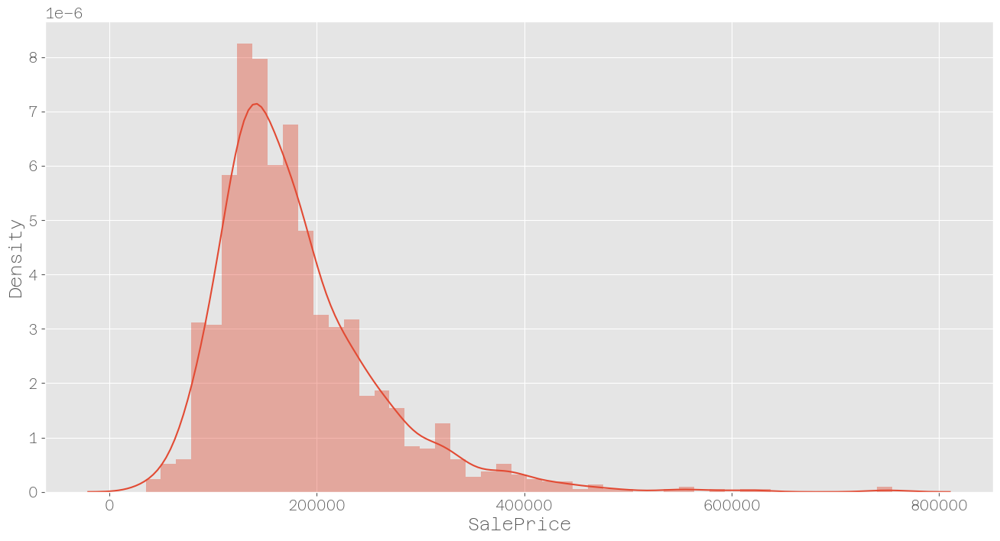

In [6]:
# Since mean > median, we can see that this distribution is skewed to the right
# mean -median = +/- 20000, which is very different from std, thus fairly skwed
plt.figure(figsize=(16, 8))
sns.distplot(df_train["SalePrice"])

plt.show()

<Axes: ylabel='SalePrice'>

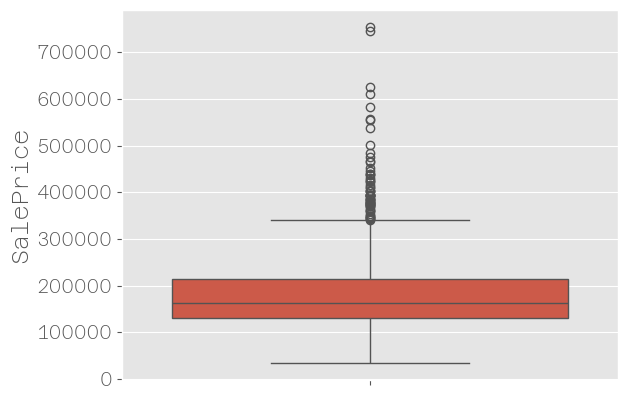

In [7]:
sns.boxplot(df_train["SalePrice"])

**GENERAL GUIDELINES FOR SKEWNESS AND KURTOSIS**

Skewness:
- -0.5 to 0.5: Fairly symmetrical distribution.   
- -1 to -0.5 or 0.5 to 1: Moderately skewed.   
- Less than -1 or greater than 1: Highly skewed.   


Kurtosis:
- 0: Mesokurtic (similar to normal distribution).   
- Greater than 0: Leptokurtic (peaked distribution with heavy tails).   
- Less than 0: Platykurtic (flat distribution with light tails).   


In [8]:
print(f"Skewness: { df_train['SalePrice'].skew()}")
print(f"Kurtosis: {df_train['SalePrice'].kurt()}")

Skewness: 1.8828757597682129
Kurtosis: 6.536281860064529


### 1.1 Numerical Variables

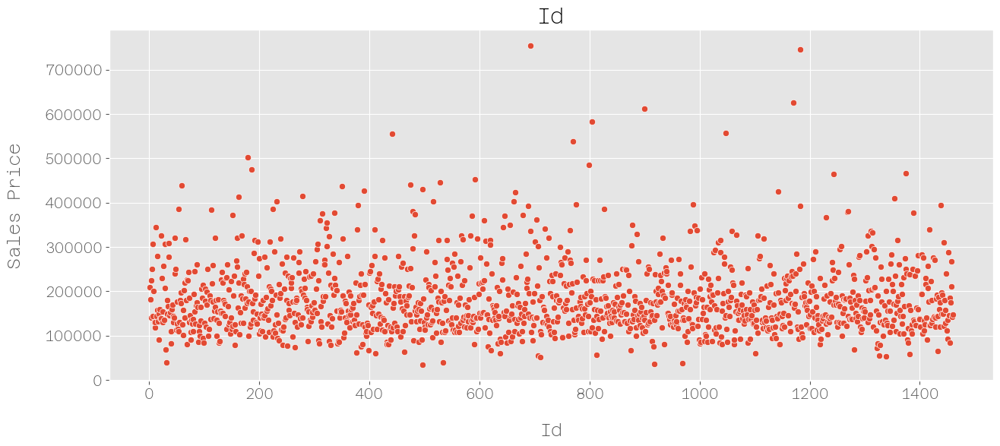

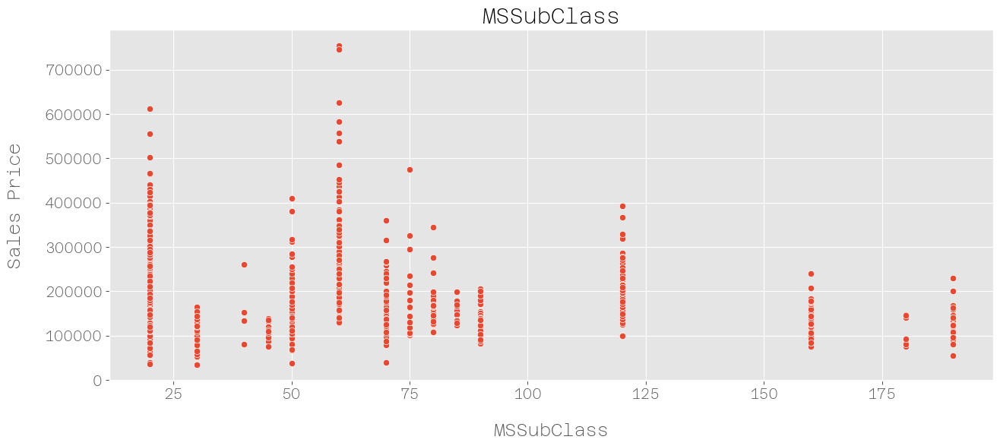

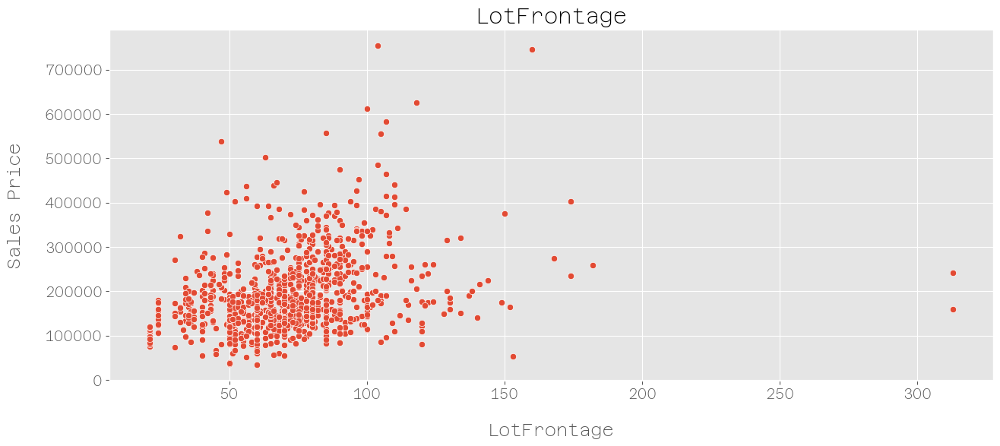

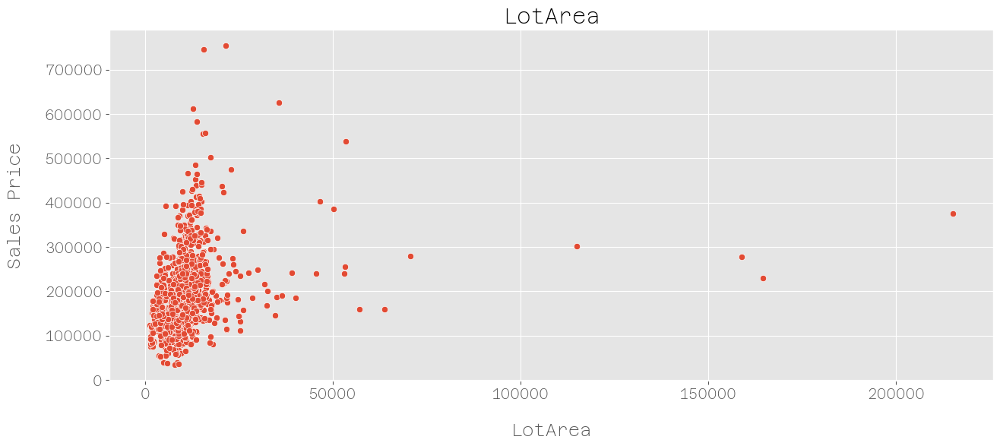

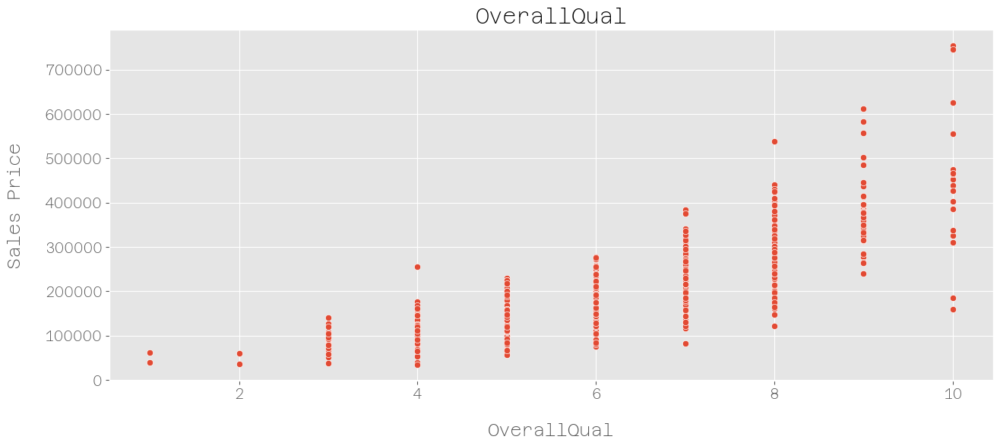

...

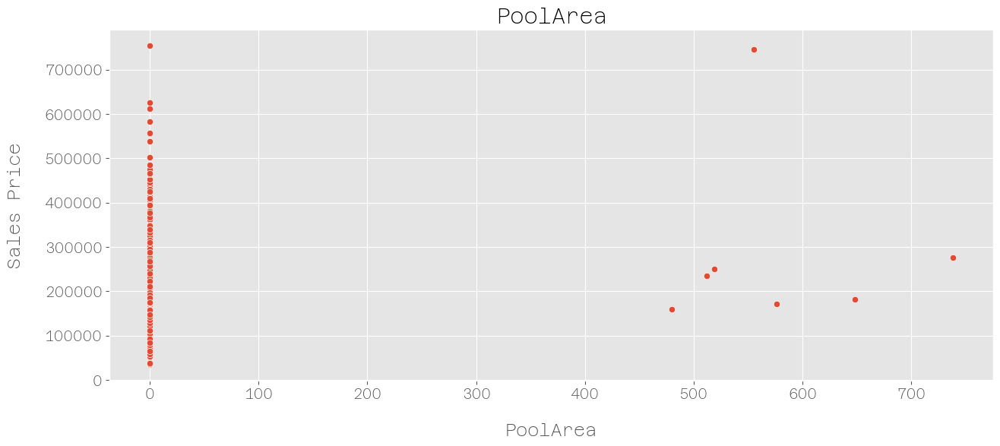

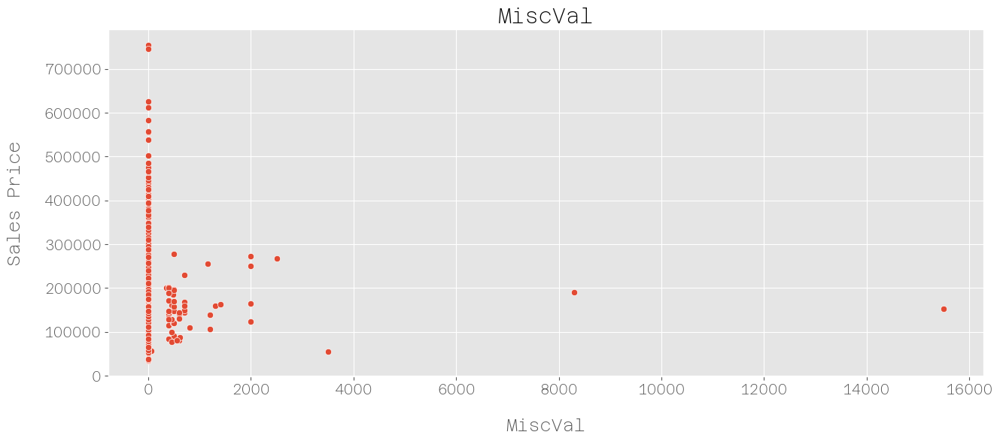

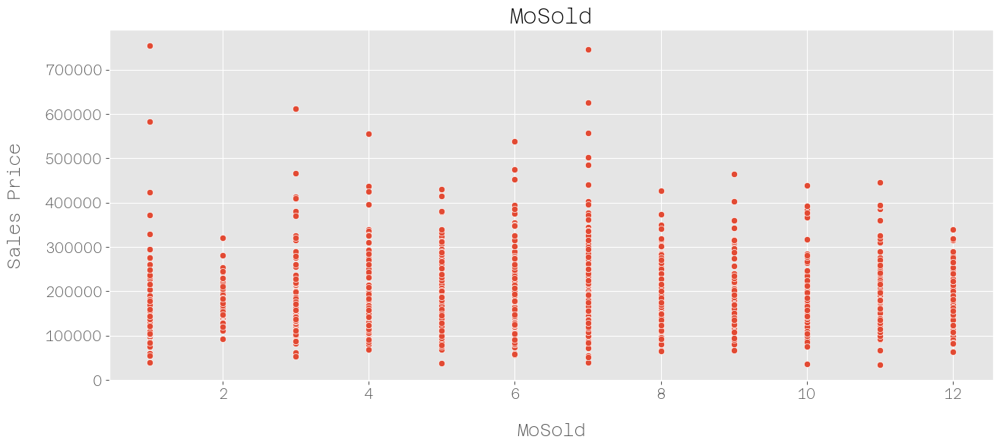

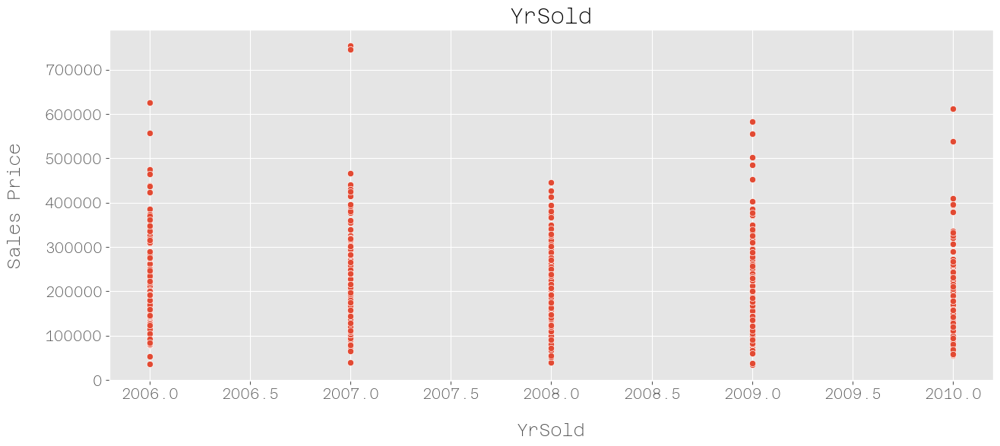

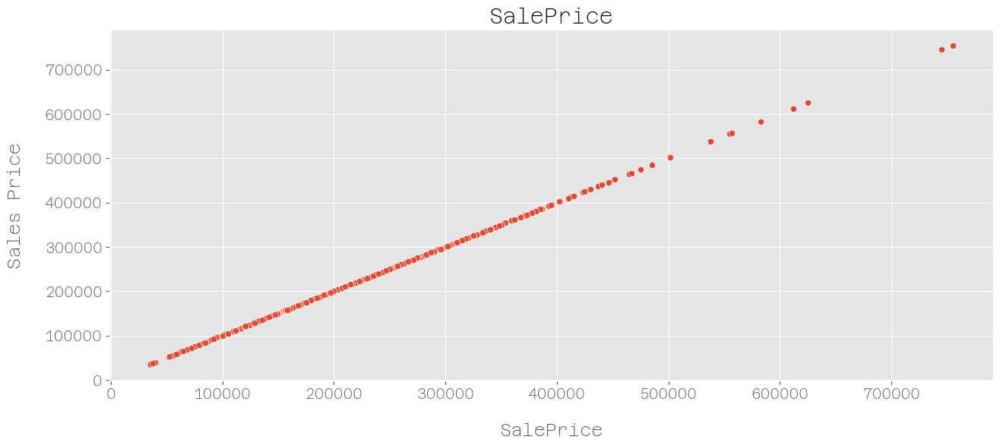

In [9]:
# scatter plot for numeric variables
#vars = ["GrLivArea", "TotalBsmtSF"]
vars_num = df_train.select_dtypes(include=["float64", "int64"]).columns.to_list()

for v in vars_num:
    plt.figure(figsize=(15, 6))
    sns.scatterplot(data=df_train, x=v, y="SalePrice")
    plt.xlabel(v, labelpad=20)
    plt.ylabel("Sales Price", labelpad=20)
    plt.title(v)
    plt.show()

### 1.2 Categorical Variables

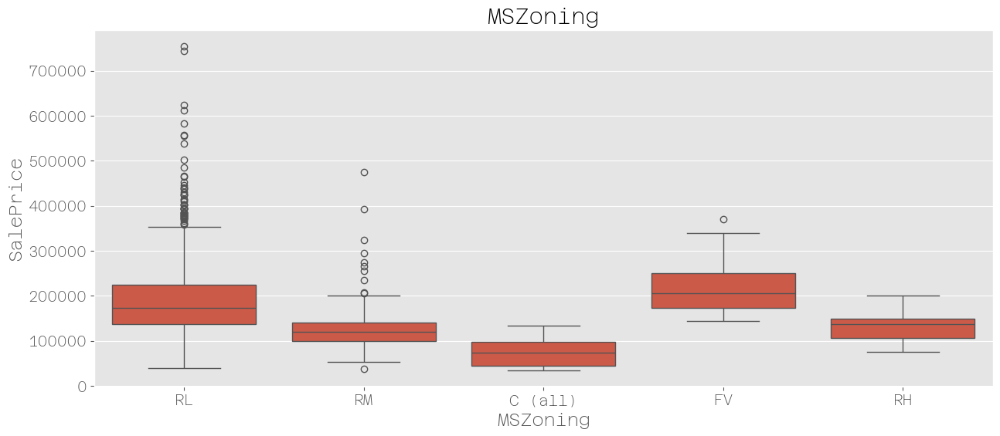

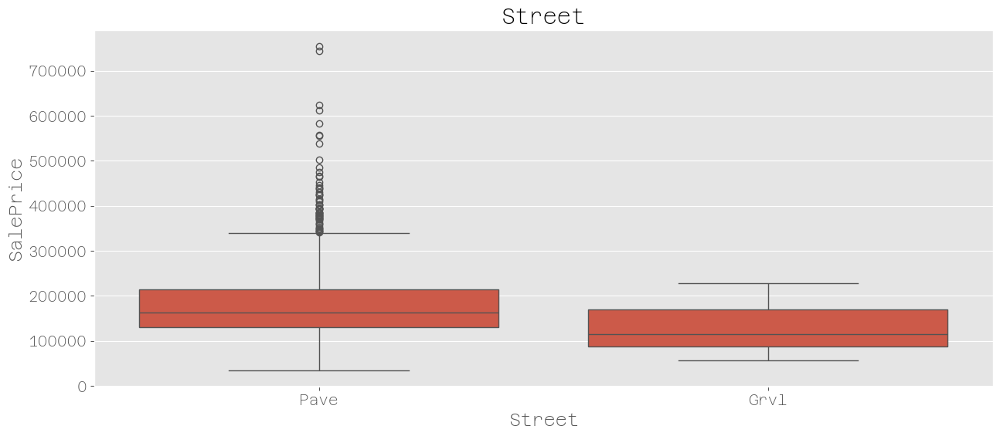

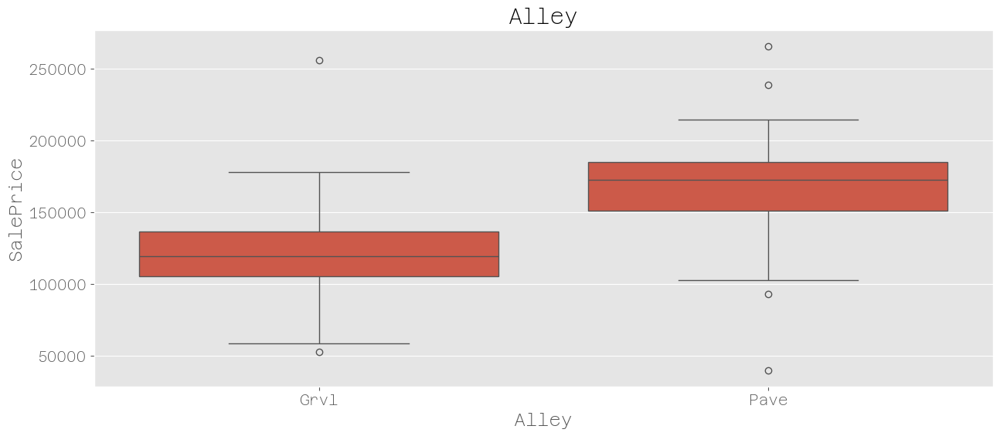

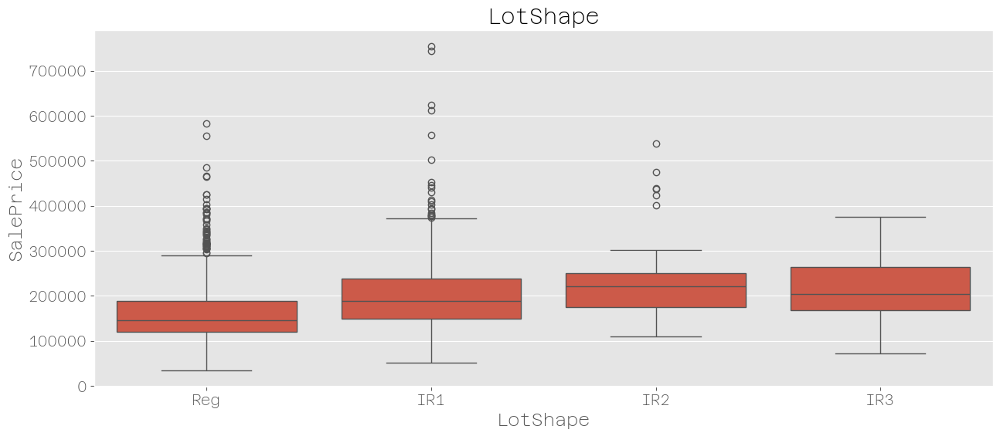

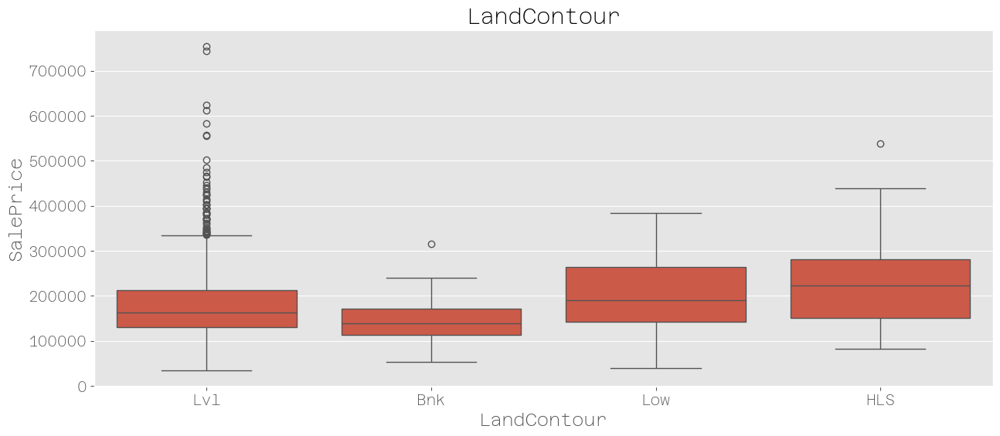

...

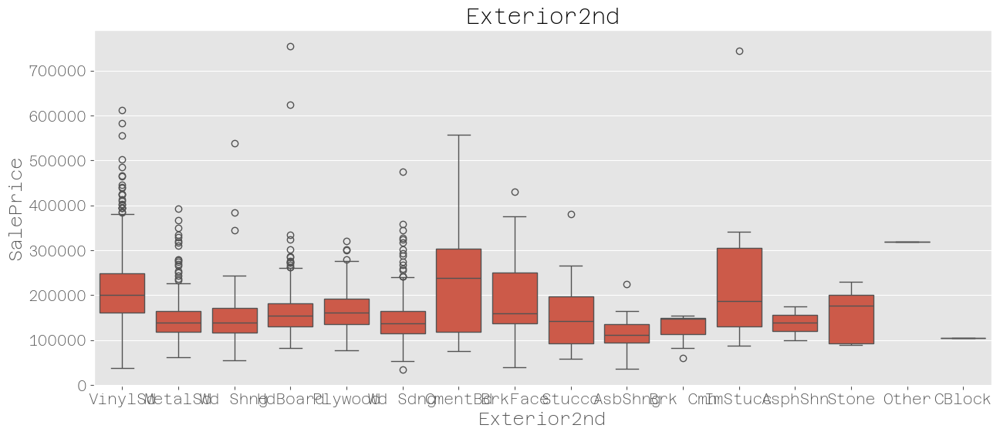

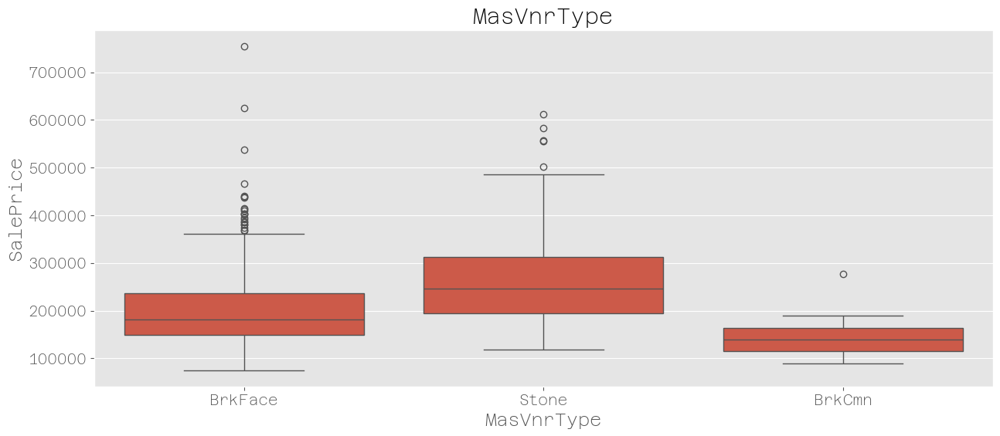

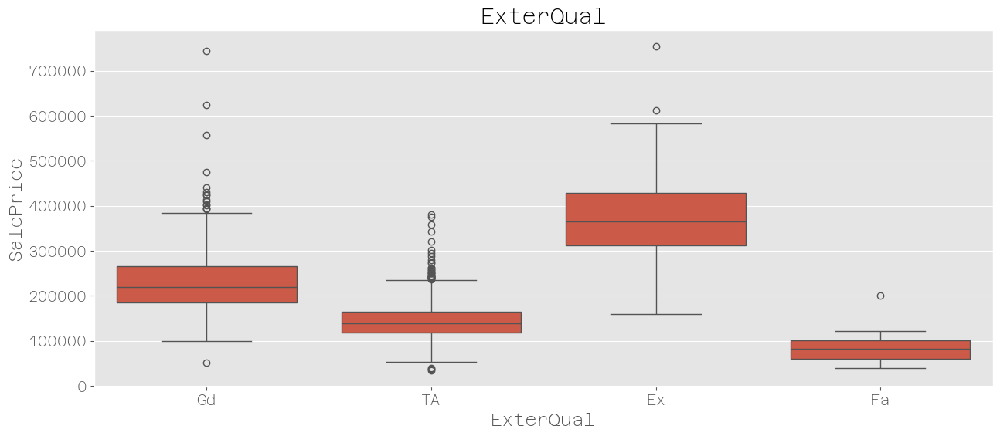

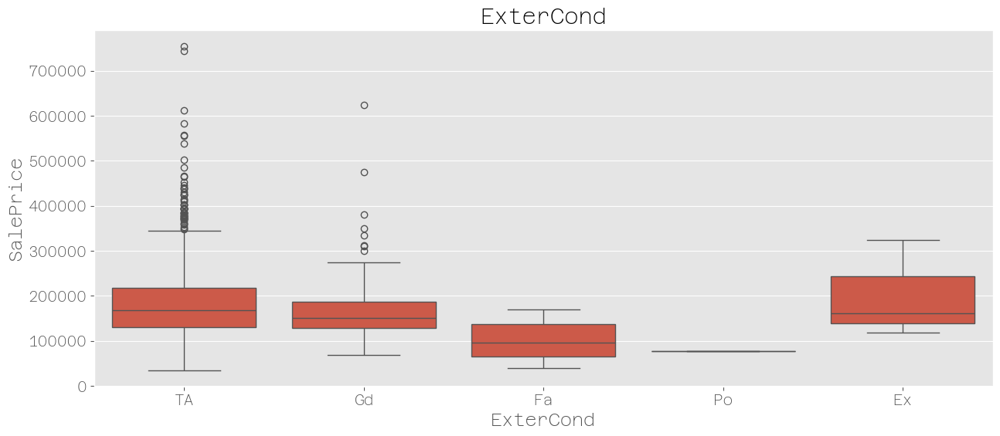

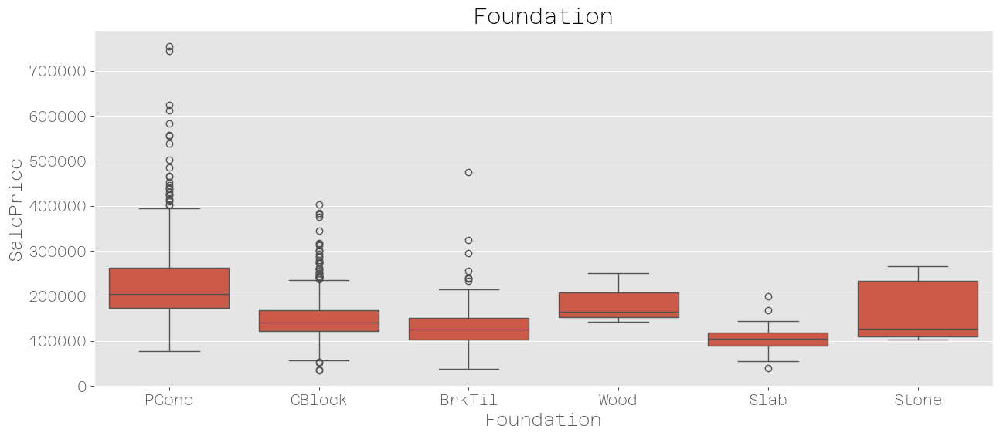

In [10]:
# now we will plot some graphs to understand the role of categorical variables and sale price
vars_cat = df_train.select_dtypes(include="object").columns.to_list()

for v in vars_cat:
    plt.figure(figsize=(15,6))
    sns.boxplot(data=df_train, x=v, y="SalePrice")
    plt.title(v)
    plt.show()


### 1.3 Correlation Matrix

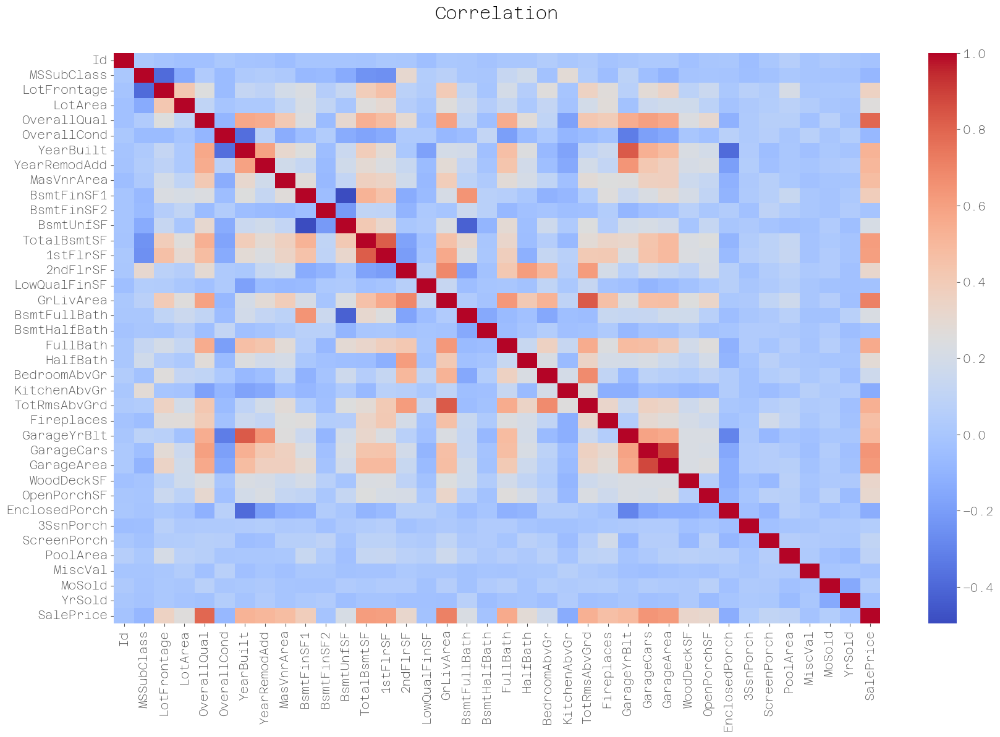

In [ ]:
correlation = df_train[vars_num].corr()

# Plot correlation heatmap
plt.figure(figsize=(20,12))
sns.heatmap(correlation, annot=False, cmap='coolwarm')
plt.title('Correlation', pad=40)
plt.show()

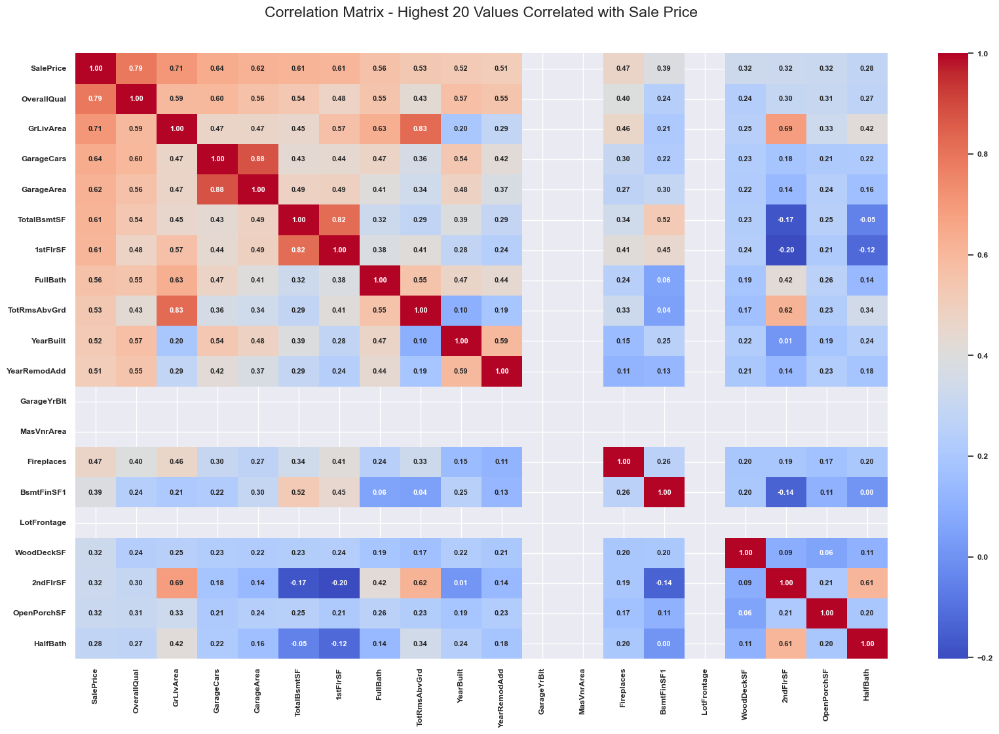

In [ ]:
# Sale Price correlation matrix with the K highest correlation values

k = 20

columns = correlation.nlargest(k, "SalePrice")["SalePrice"].index

cm = np.corrcoef(df_train[columns].values.T)

# Plot correlation heatmat
plt.figure(figsize=(20,12))
sns.set(font_scale=0.8)
sns.heatmap(cm, cbar=True, cmap="coolwarm", annot=True, fmt=".2f",annot_kws={'size': 8},
            yticklabels=columns.values, xticklabels=columns.values, linewidths=0)
plt.title(f"Correlation Matrix - Highest {k} Values Correlated with Sale Price", pad=40, size="xx-large")

plt.show()

### 1.4 ScatterPlots - Full sprectrum

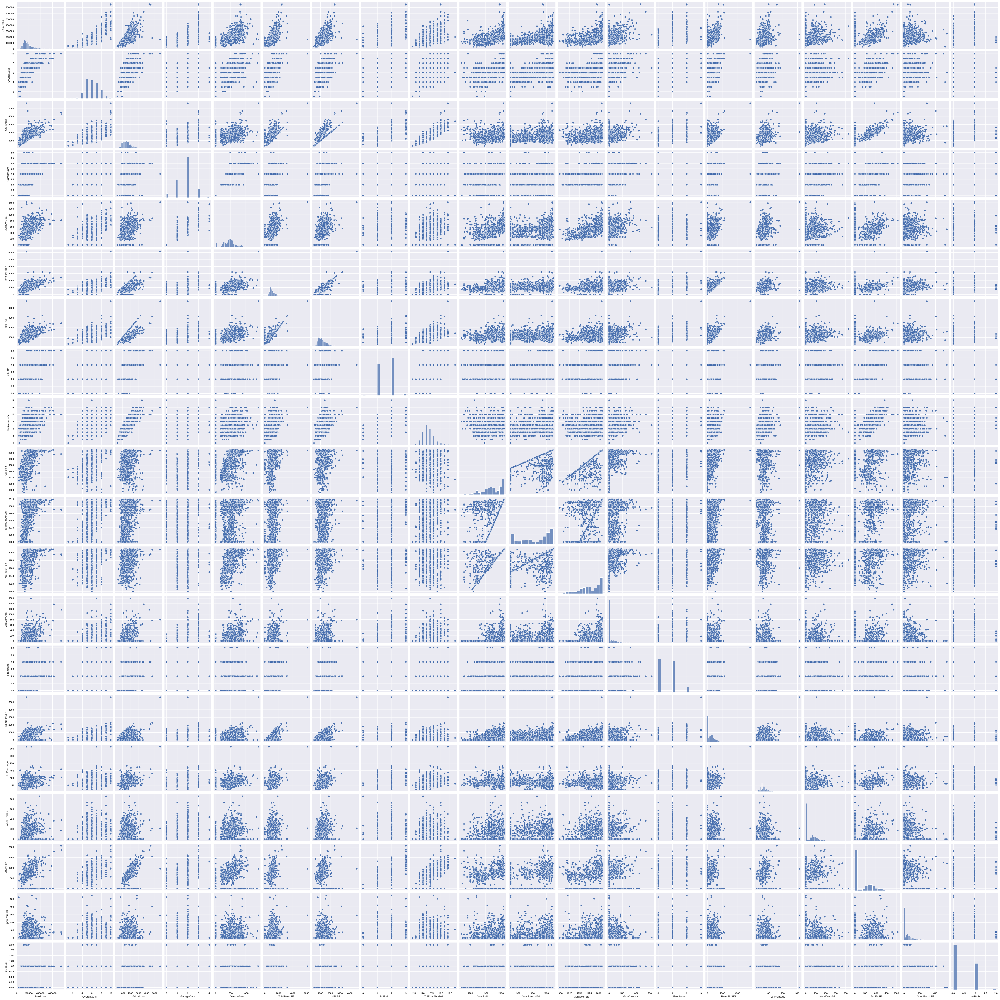

In [ ]:
sns.pairplot(df_train[columns]) # uses the columns with highest correlation values to plot scatterplots
plt.show()

## 2. Handling missing values

In [ ]:
# check again amount of missing values
pd.set_option('display.max_rows', None)
print(df_train.isna().sum())

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType        872
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

I see that for some features there is a large number of missing values (>365, or more than 25% of the dataset). Therefore I will delete the following columns from my analysis:

- "Alley", "MasVnrType","FireplaceQu", "PoolQC", "Fence", "MiscFeature"

In [ ]:
columns_to_delete = ["Alley", "MasVnrType","FireplaceQu", "PoolQC", "Fence", "MiscFeature"]

I will drop the rows where there is less than 10% of missing values.
They are: MasVnrArea, Electrical

In [ ]:
df_train.dropna(subset=["MasVnrArea", "Electrical"], inplace=True)

df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1451 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1451 non-null   int64  
 1   MSSubClass     1451 non-null   int64  
 2   MSZoning       1451 non-null   object 
 3   LotFrontage    1194 non-null   float64
 4   LotArea        1451 non-null   int64  
 5   Street         1451 non-null   object 
 6   Alley          90 non-null     object 
 7   LotShape       1451 non-null   object 
 8   LandContour    1451 non-null   object 
 9   Utilities      1451 non-null   object 
 10  LotConfig      1451 non-null   object 
 11  LandSlope      1451 non-null   object 
 12  Neighborhood   1451 non-null   object 
 13  Condition1     1451 non-null   object 
 14  Condition2     1451 non-null   object 
 15  BldgType       1451 non-null   object 
 16  HouseStyle     1451 non-null   object 
 17  OverallQual    1451 non-null   int64  
 18  OverallCond  

Then I have a couple of features I will analyse individually based on the correlation matrixes I plot in 1.3. If the features seem to have a relationship with SalePrice, then I will treat them. Otherwise, I will not use them to build my models.

The features are:

- LotFrontage       259           *-- This will be deleted, since it has a weak correlation with SalePrice. It is also correlated with LotArea, which we will take into analysis. Therefore, to avoid multicollinearity, we will do not consider this.*
- BsmtQual           37           *-- This seems to have some influence, so I will create a new "UKN" category for unknown values*
- BsmtCond           37           *-- This seems to have some influence, so I will create a new "UKN" category for unknown values*
- BsmtExposure       38           *-- This seems to have some influence, so I will create a new "UKN" category for unknown values*
- BsmtFinType1       37           *-- This will be deleted, as the median of the SalePrice is somewhat consistent across all values*
- BsmtFinType2       38           *-- This will be deleted, as the median of the SalePrice is somewhat consistent across all values*
- GarageType         81           *-- This seems to have some influence, so I will create a new "UKN" category for unknown values*
- GarageYrBlt        81           *-- This will be deleted, it has a weak correlation with SalePrice*
- GarageFinish       81           *-- This seems to have some influence, so I will create a new "UKN" category for unknown values*
- GarageQual         81           *-- This seems to have some influence, so I will create a new "UKN" category for unknown values*
- GarageCond         81           *-- This seems to have some influence, so I will create a new "UKN" category for unknown values*

In [ ]:
columns_to_delete += ["LotFrontage", "BsmtFinType1", "BsmtFinType2", "GarageYrBlt"]

In [ ]:
columns_to_unknown = ["BsmtQual", "BsmtCond", "BsmtExposure", "GarageType", "GarageFinish", "GarageQual", "GarageCond"]

In [ ]:
# First, let's treat the columns to fill with unknown
columns_to_unknown = ["BsmtQual", "BsmtCond", "BsmtExposure", "GarageType", "GarageFinish", "GarageQual", "GarageCond"]
df_train[columns_to_unknown] = df_train[columns_to_unknown].fillna("UKN")

df_train.isna().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       257
LotArea             0
Street              0
Alley            1361
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType        863
MasVnrArea          0
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual            0
BsmtCond            0
BsmtExposure        0
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

Before moving to deleting the features I won't use in the models, I will check again 1.3 Correlation Matrix to see if I should remove additional columns based on multicollinearity. 
The cases are treated individually:

- Id: *This will be removed, as it has no influence in the price*
- GarageYrBlt & YearBuilt: *GarageYrBlt is already being excluded, so no worried here*
- EnclosedPorch & YearBuilt: *EnclosedPorch will leave, since YearBuilt has a higher correlation with SalePrice*
- 1stFlrSF & TotalBsmtSF: *I will remove TotalBsmtSF, as both features seem to have the same degree of correlation with SalePrice*
- GrLivArea & TotRmsAbvGrd: *I will remove TotRmsAbvGrd, as GrLivArea has a higher correlation with SalePrice*
- GarageCars & GarageArea: *I will remove GarageArea, as GarageCars have a slightly higher correlation with SalePrice*

In [ ]:
columns_to_delete+=["Id", "TotalBsmtSF", "GarageArea", "EnclosedPorch", "TotRmsAbvGrd"]

# create X_train
X_train = df_train.drop(columns=columns_to_delete, axis=1)

X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1451 entries, 0 to 1459
Data columns (total 66 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1451 non-null   int64  
 1   MSZoning       1451 non-null   object 
 2   LotArea        1451 non-null   int64  
 3   Street         1451 non-null   object 
 4   LotShape       1451 non-null   object 
 5   LandContour    1451 non-null   object 
 6   Utilities      1451 non-null   object 
 7   LotConfig      1451 non-null   object 
 8   LandSlope      1451 non-null   object 
 9   Neighborhood   1451 non-null   object 
 10  Condition1     1451 non-null   object 
 11  Condition2     1451 non-null   object 
 12  BldgType       1451 non-null   object 
 13  HouseStyle     1451 non-null   object 
 14  OverallQual    1451 non-null   int64  
 15  OverallCond    1451 non-null   int64  
 16  YearBuilt      1451 non-null   int64  
 17  YearRemodAdd   1451 non-null   int64  
 18  RoofStyle    

In [ ]:
# just double checking
X_train.isna().sum()

MSSubClass       0
MSZoning         0
LotArea          0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinSF1       0
BsmtFinSF2       0
BsmtUnfSF        0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
Functional       0
Fireplaces       0
GarageType       0
GarageFinish     0
GarageCars       0
GarageQual  

In [ ]:
# now let's check df_test
X_test = df_test.drop(columns=columns_to_delete, axis=1)

X_test.isna().sum()

MSSubClass        0
MSZoning          4
LotArea           0
Street            0
LotShape          0
LandContour       0
Utilities         2
LotConfig         0
LandSlope         0
Neighborhood      0
Condition1        0
Condition2        0
BldgType          0
HouseStyle        0
OverallQual       0
OverallCond       0
YearBuilt         0
YearRemodAdd      0
RoofStyle         0
RoofMatl          0
Exterior1st       1
Exterior2nd       1
MasVnrArea       15
ExterQual         0
ExterCond         0
Foundation        0
BsmtQual         44
BsmtCond         45
BsmtExposure     44
BsmtFinSF1        1
BsmtFinSF2        1
BsmtUnfSF         1
Heating           0
HeatingQC         0
CentralAir        0
Electrical        0
1stFlrSF          0
2ndFlrSF          0
LowQualFinSF      0
GrLivArea         0
BsmtFullBath      2
BsmtHalfBath      2
FullBath          0
HalfBath          0
BedroomAbvGr      0
KitchenAbvGr      0
KitchenQual       1
Functional        2
Fireplaces        0
GarageType       76


In [ ]:
# let's fill X_test with the columns_to_uknknow and check again
X_test[columns_to_unknown] = X_test[columns_to_unknown].fillna("UKN")

X_test.isna().sum()

MSSubClass        0
MSZoning          4
LotArea           0
Street            0
LotShape          0
LandContour       0
Utilities         2
LotConfig         0
LandSlope         0
Neighborhood      0
Condition1        0
Condition2        0
BldgType          0
HouseStyle        0
OverallQual       0
OverallCond       0
YearBuilt         0
YearRemodAdd      0
RoofStyle         0
RoofMatl          0
Exterior1st       1
Exterior2nd       1
MasVnrArea       15
ExterQual         0
ExterCond         0
Foundation        0
BsmtQual          0
BsmtCond          0
BsmtExposure      0
BsmtFinSF1        1
BsmtFinSF2        1
BsmtUnfSF         1
Heating           0
HeatingQC         0
CentralAir        0
Electrical        0
1stFlrSF          0
2ndFlrSF          0
LowQualFinSF      0
GrLivArea         0
BsmtFullBath      2
BsmtHalfBath      2
FullBath          0
HalfBath          0
BedroomAbvGr      0
KitchenAbvGr      0
KitchenQual       1
Functional        2
Fireplaces        0
GarageType        0


Here, as I still have to submit a prediction for all values in X_test, I cannot simply remove them.
If we were in the real world, I could possibily treat manually some of the fields in the test set, such as MSZoning.

## 3. Models

### 3.0 Functions to support this step

In [ ]:
def save_model_gen_prediction(model, model_results, name_output_csv_file):
    """"
    DOES:
    - Saves model results for future analysis in .CSV file;
    - Generates Kaggle file for submission on the competition

    GETS:
    - model: a model from GridSearchCV
    - model_results: dictionary
    - name_output_csv_file: string

    """""


    # save dictionary model_results to .csv file for future comparisions
    # convert dictionary to DF
    df_model_results = pd.DataFrame(model_results, index=[0])
    # save DF to CSV
    # prepare path to save model results for comparision
    results = "output/house_regression.csv"
    df_model_results.to_csv(results, mode='a', header=False, index=False)

    # generate file to export to Kaggle with predictions
    # makes predictions
    predictions_kaggle = model.predict(X_test)
    print(predictions_kaggle)

    # save to file
    output = pd.DataFrame({'Id': df_test.Id, 'SalePrice': predictions_kaggle})
    name_output_csv_file = "submission_house_price_regression_"+ name_output_csv_file + ".csv"
    output.to_csv(name_output_csv_file, index=False)
    print("Your submission was successfully saved!")



In [ ]:

def get_model_results(X_train_model, X_test_model, grid_search, model_type):
    # Make predictions
    y_pred_train = grid_search.predict(X_train_model)
    y_pred_validation = grid_search.predict(X_validation_model)
    y_pred_test = grid_search.predict(X_test_model)

    # Calculate evaluation metrics
    mse_train = mean_squared_error(y_train_model, y_pred_train)
    mse_validation = mean_squared_error(y_validation_model, y_pred_validation)
    mse_test = mean_squared_error(y_test_model, y_pred_test)

    # MAE: Calculates the average of much the prices are off
    # treats all errors equally, thus less sensitive to
    # easier to interpret
    mae_train = mean_absolute_error(y_train_model, y_pred_train)
    mae_validation = mean_absolute_error(y_validation_model, y_pred_validation)
    mae_test = mean_absolute_error(y_test_model, y_pred_test)

    # RMSE: in average, the error predicition is this value
    # more sensitive to outliers
    # good to be considered in situations where outliers should be heavily penalised
    rmse_train = np.sqrt(mse_train)
    rmse_validation = np.sqrt(mse_validation)
    rmse_test = np.sqrt(mse_test)


    # R-squared: values closer to 1 are better
    # indicates the percentage of the variance in data can be explained by the model
    r2_train = r2_score(y_train_model, y_pred_train)
    r2_validation = r2_score(y_validation_model, y_pred_validation)
    r2_test = r2_score(y_test_model, y_pred_test)


    # Save results
    model_results = {
        "model": model_type,
        "parameters": str(grid_search.best_params_),
        "best cv score": grid_search.best_score_,
        "validation score": grid_search.score(X_validation_model, y_validation_model),
        "test score": grid_search.score(X_test_model, y_test_model),
        "MAE train": mae_train,
        "MAE validation": mae_validation,
        "MAE test": mae_test,
        "RMSE train": rmse_train,
        "RMSE validation": rmse_validation,
        "RMSE test": rmse_test,
        "R2 train": r2_train,
        "R2 validation": r2_validation,
        "R2 test": r2_test
    }

    # print results
    for key, value in model_results.items():
        print(f"{key} : {value}")

    return model_results

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
# evaluation metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
# pipeline
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
# preprocessing
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, PowerTransformer, StandardScaler, PolynomialFeatures


# Define the OneHotEncoder for categorical features
one_hot_encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# select features I will use
X_train_selected = X_train.drop("SalePrice", axis=1)


# create the labels
y_train = X_train["SalePrice"]


In [ ]:
# create test & validation+train
X_trainval_model,  X_test_model, y_trainval_model, y_test_model = train_test_split(X_train_selected, y_train, test_size=0.1, random_state=25)

# create validation and train sets
X_train_model, X_validation_model, y_train_model, y_validation_model = train_test_split(X_trainval_model, y_trainval_model, test_size=0.2, random_state=25)

print(f"Test Set Size: {X_test_model.shape}")
print(f"Train Set Size: {X_train_model.shape}")
print(f"Validation Set Size: {X_validation_model.shape}")

# list to save values for future comparision
all_models = []


X_train_model.info()

Test Set Size: (146, 65)
Train Set Size: (1044, 65)
Validation Set Size: (261, 65)
<class 'pandas.core.frame.DataFrame'>
Index: 1044 entries, 1177 to 996
Data columns (total 65 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1044 non-null   int64  
 1   MSZoning       1044 non-null   object 
 2   LotArea        1044 non-null   int64  
 3   Street         1044 non-null   object 
 4   LotShape       1044 non-null   object 
 5   LandContour    1044 non-null   object 
 6   Utilities      1044 non-null   object 
 7   LotConfig      1044 non-null   object 
 8   LandSlope      1044 non-null   object 
 9   Neighborhood   1044 non-null   object 
 10  Condition1     1044 non-null   object 
 11  Condition2     1044 non-null   object 
 12  BldgType       1044 non-null   object 
 13  HouseStyle     1044 non-null   object 
 14  OverallQual    1044 non-null   int64  
 15  OverallCond    1044 non-null   int64  
 16  YearBuilt      1

In [ ]:
X_validation_model.info()

<class 'pandas.core.frame.DataFrame'>
Index: 261 entries, 1300 to 858
Data columns (total 65 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     261 non-null    int64  
 1   MSZoning       261 non-null    object 
 2   LotArea        261 non-null    int64  
 3   Street         261 non-null    object 
 4   LotShape       261 non-null    object 
 5   LandContour    261 non-null    object 
 6   Utilities      261 non-null    object 
 7   LotConfig      261 non-null    object 
 8   LandSlope      261 non-null    object 
 9   Neighborhood   261 non-null    object 
 10  Condition1     261 non-null    object 
 11  Condition2     261 non-null    object 
 12  BldgType       261 non-null    object 
 13  HouseStyle     261 non-null    object 
 14  OverallQual    261 non-null    int64  
 15  OverallCond    261 non-null    int64  
 16  YearBuilt      261 non-null    int64  
 17  YearRemodAdd   261 non-null    int64  
 18  RoofStyle   

### 3.0  Preprocessing the data

In [ ]:
# Pre-processing the data

# the function below returns a preprocessor & non-skewed columns
# The preprocessor: treats skewed columns and categorical
from sklearn.preprocessing import RobustScaler # used to normalise data with high variance

# Keep in mind that ColumnTransformer does not guarantee that columns will be in the same order as the original DataFrame.
# so keep house_id

def preprocess_data(df):
    numeric_columns = df.select_dtypes(include=["float64", "int64"]).columns
    categorical_columns = df.select_dtypes(include=["object"]).columns

    skeweness = df[numeric_columns].skew()

    # filter skewed columns based on threshold of 0.5
    skewed_columns = skeweness[abs(skeweness)>0.5].index

    non_skewed_columns = numeric_columns.difference(skewed_columns)

    preprocessor = ColumnTransformer(
        transformers = [
            ("skewed", RobustScaler(), skewed_columns),
            #("non_skewed", StandardScaler(), non_skewed_columns),
            ("categorical", OneHotEncoder(handle_unknown='ignore'), categorical_columns), #bring one hot encoder later to avoid issues with the scale
            ("passthrough", "passthrough", non_skewed_columns)
        ]
    )

    return preprocessor, non_skewed_columns, skewed_columns

In [ ]:
preprocessor, non_skewed_columns, skewed_columns = preprocess_data(X_train_model)

# Fit the preprocessor on training data
#preprocessor.fit(X_train_model)

#X_test_model, nkc, sc = preprocess_data(X_test_model)

print(non_skewed_columns)
print(30*"-")
print(skewed_columns)

Index(['BedroomAbvGr', 'FullBath', 'GarageCars', 'MoSold', 'OverallQual',
       'YrSold'],
      dtype='object')
------------------------------
Index(['MSSubClass', 'LotArea', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath',
       'HalfBath', 'KitchenAbvGr', 'Fireplaces', 'WoodDeckSF', 'OpenPorchSF',
       '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal'],
      dtype='object')


In [ ]:
#transformed_data = preprocessor.fit_transform(X_test_model)
#print(transformed_data)

In [ ]:
preprocessor

ColumnTransformer(transformers=[('skewed', RobustScaler(),
                                 Index(['MSSubClass', 'LotArea', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath',
       'HalfBath', 'KitchenAbvGr', 'Fireplaces', 'WoodDeckSF', 'OpenPorchSF',
       '3SsnPorch', 'ScreenPorch',...
       'Exterior2nd', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'Heating', 'HeatingQC', 'CentralAir',
       'Electrical', 'KitchenQual', 'Functional', 'GarageType', 'GarageFinish',
       'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition'],
      dtype='object')),
                                ('passthrough', 'passthrough',
                                 Index(['BedroomAbvGr', 'FullBath', 'GarageCars', 'MoSold', 'OverallQual',
       'YrSold'],
      dtype='object'))])

In [ ]:
X_test_model.isnull().sum()

MSSubClass       0
MSZoning         0
LotArea          0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinSF1       0
BsmtFinSF2       0
BsmtUnfSF        0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
Functional       0
Fireplaces       0
GarageType       0
GarageFinish     0
GarageCars       0
GarageQual  

### 3.0 Treat null values for prediction

In [ ]:
col_names = X_test.columns[X_test.isnull().any()]
col_types = X_test[col_names].dtypes
col_null_count = X_test[col_names].isnull().sum()

print(pd.DataFrame({
    "column_name": col_names, "data_type": col_types, "missing values": col_null_count
}))


               column_name data_type  missing values
MSZoning          MSZoning    object               4
Utilities        Utilities    object               2
Exterior1st    Exterior1st    object               1
Exterior2nd    Exterior2nd    object               1
MasVnrArea      MasVnrArea   float64              15
BsmtFinSF1      BsmtFinSF1   float64               1
BsmtFinSF2      BsmtFinSF2   float64               1
BsmtUnfSF        BsmtUnfSF   float64               1
BsmtFullBath  BsmtFullBath   float64               2
BsmtHalfBath  BsmtHalfBath   float64               2
KitchenQual    KitchenQual    object               1
Functional      Functional    object               2
GarageCars      GarageCars   float64               1
SaleType          SaleType    object               1


In [ ]:
# select values to treat
X_test_numeric_null = X_test[col_names].select_dtypes(include=["float64"]).columns.to_list()
X_test_categoric_null = X_test[col_names].select_dtypes(include=["object"]).columns.to_list()

# Fill missing values
for col in X_test_numeric_null:
    X_test[col].fillna(X_test[col].mean(), inplace=True)

for col in X_test_categoric_null:
    X_test[col] = X_test[col].fillna("UKN")

/var/folders/r9/ggpr596s74x4hr8c_sfdzc580000gn/T/ipykernel_4139/515205736.py:7: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X_test[col].fillna(X_test[col].mean(), inplace=True)


Since it's not many values, I will spead up this process and treat numeric and categorical.

### 3.1 Linear Regression

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MaxAbsScaler

pipe = Pipeline([
    ("preprocessor", preprocessor),
    ('scaler_nonskewed', StandardScaler()),  # Name the step 'scaler'
    ('poly', PolynomialFeatures(include_bias=False)),  # Include PolynomialFeatures
    ('linearegression', LinearRegression())  # Name the step 'linearegression'
])

# for the parameter grid it is important to use the name given by 'make_pipeline'
# you can see this with the function steps

parameter_grid = {
    "scaler_nonskewed": [MaxAbsScaler(), MinMaxScaler()],
    "poly__degree": [1, 2, 3],  # Try degrees 1, 2, and 3 for polynomial features
    'linearegression__fit_intercept': [True, False]
    }

grid_linreg= GridSearchCV(pipe, parameter_grid, cv=5, scoring="neg_mean_squared_error")

grid_linreg.fit(X_train_model, y_train_model)

model_results = get_model_results(X_train_model, X_test_model, grid_linreg, "linear_reg")

save_model_gen_prediction(grid_linreg, model_results, "linreg_010")







/Users/gabi/data_science/data_science/ve_ml/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
30 fits failed out of a total of 60.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
30 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/gabi/data_science/data_science/ve_ml/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/gabi/data_science/data_science/ve_ml/lib/python3.10/site-packages/sklearn/base.py", line 1473, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/Users/gabi/data_science/data_science/ve_ml/lib/python3.10/site-package

model : linear_reg
parameters : {'linearegression__fit_intercept': False, 'poly__degree': 1, 'scaler_nonskewed': MaxAbsScaler()}
best cv score : -1259420984.1594183
validation score : -910621824.9421562
test score : -2105997505.288563
MAE train : 12891.827765216032
MAE validation : 18217.80771451575
MAE test : 21186.84321415809
RMSE train : 18545.74222075178
RMSE validation : 30176.511145958477
RMSE test : 45891.14844159561
R2 train : 0.9424414598784929
R2 validation : 0.8826596214108757
R2 test : 0.638315626390638
[103362.08104972 166894.97579827 184042.44391678 ... 165380.4742226
 116786.46875895 220827.93672168]
Your submission was successfully saved!


#### 3. Interpreting the Residual Plots
**Residuals vs. Predicted Values Plot**
No clear pattern: The points are scattered randomly without forming any distinct shape (funnel, curve, etc.). This is a good sign as it indicates that the variance of the residuals is constant across different predicted values.

**Histogram of Residuals**
Approximately Normal: The histogram shows a roughly bell-shaped distribution, suggesting that the residuals are approximately normally distributed. This is a good indication that the model's error terms are normally distributed, which is an assumption of linear regression.

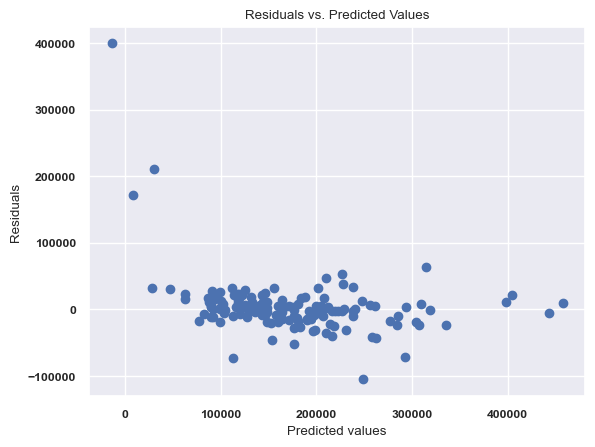

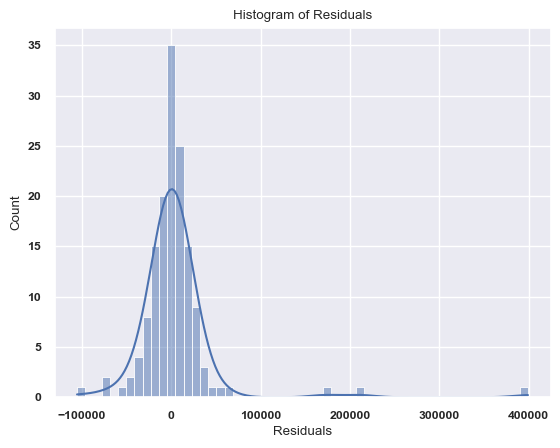

In [ ]:
#grid_linreg.feature_importances_

# Calculate residuals
y_pred = grid_linreg.predict(X_test_model)
residuals = y_test_model - y_pred

# Plot residuals vs. predicted values
plt.scatter(y_pred, residuals)
plt.xlabel("Predicted values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Predicted Values")
plt.show()

# Histogram of residuals
sns.histplot(residuals, kde=True) 

plt.xlabel("Residuals")
plt.title("Histogram of Residuals")
plt.show()

# Q-Q plot
#import statsmodels.api as sm
#sm.qqplot(residuals, line='s')
#plt.title("Q-Q Plot")
#plt.show()


### 3.2 Ridge

In [ ]:
from sklearn.linear_model import Ridge

non_skewed_indices = [X_train_model.columns.get_loc(col) for col in non_skewed_columns]

pipe = Pipeline([
    ("preprocessor", preprocessor),
    #('scaler_nonskewed', StandardScaler()),
    ("scaler", ColumnTransformer(
        transformers=[("scaler", StandardScaler(), non_skewed_indices)],
        remainder = "passthrough"
    )),
    ('poly', PolynomialFeatures(include_bias=False)),
    ('ridge', Ridge(max_iter=100000))
])

parameter_grid = {
    #"scaler_nonskewed": [MaxAbsScaler(), MinMaxScaler(), StandardScaler()],
    "scaler__scaler": [StandardScaler(), MinMaxScaler(), MaxAbsScaler()],
    "poly__degree": [1, 2],  # Try lower degrees
    #'ridge__alpha': [0.1, 1, 10, 20, 50, 100, 200, 300]  # started with lower values, but higher are performing better
    'ridge__alpha': [0.1, 1, 10, 20, 50, 100, 200]  # Regularization parameter, the higher the value, the more coefficients are restricted
}


grid_ridge= GridSearchCV(pipe, parameter_grid, cv=5, scoring="neg_mean_squared_error")

grid_ridge.fit(X_train_model, y_train_model)

model_results = get_model_results(X_train_model, X_test_model, grid_ridge, "ridge")

save_model_gen_prediction(grid_ridge, model_results, "ridge_scalers_prep_018_skew-7")

model : ridge
parameters : {'poly__degree': 1, 'ridge__alpha': 100, 'scaler__scaler': MaxAbsScaler()}
best cv score : -1204257817.9980896
validation score : -1384263162.5986288
test score : -494525686.5945629
MAE train : 16973.63507330215
MAE validation : 20312.592539019384
MAE test : 16492.430988447722
RMSE train : 29272.844080778705
RMSE validation : 37205.68723459666
RMSE test : 22237.933505489284
R2 train : 0.856599333002156
R2 validation : 0.8216274208268407
R2 test : 0.9150700735682085
[108585.19056608 154913.040059   172277.78598487 ... 175293.86390077
 108089.71461067 236172.16665168]
Your submission was successfully saved!


/Users/gabi/data_science/data_science/ve_ml/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
140 fits failed out of a total of 210.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
70 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/gabi/data_science/data_science/ve_ml/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/gabi/data_science/data_science/ve_ml/lib/python3.10/site-packages/sklearn/base.py", line 1473, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/Users/gabi/data_science/data_science/ve_ml/lib/python3.10/site-packa

Now I will check the 30 features with more importance and decide how to treat them.

In [ ]:
best_ridge = grid_ridge.best_estimator_

# extract feature names from preprocessing step
categorical_columns = X_test_model.select_dtypes(include=["object"]).columns

# get the feature names from OneHotEncoder
one_hot = best_ridge.named_steps["preprocessor"].named_transformers_["categorical"]
one_hot_names = one_hot.get_feature_names_out(categorical_columns)

# combine all list of numerical and encoded features
all_features = list(non_skewed_columns) + list(skewed_columns) + list(one_hot_names)

# if polynomial featues was applied, it affect the number and names of columns
poly = best_ridge.named_steps["poly"]

if poly.degree > 1:
    poly_features_names = poly.get_feature_names_out(all_features)
else:
    poly_features_names = all_features

# get the coefficients from Ridge
rigde_coef = best_ridge.named_steps["ridge"].coef_



# map the coefficients to the feature names
feature_importance = pd.DataFrame({
    "feature": poly_features_names,
    "coef": rigde_coef
})

# sort by absolute value of the coefficients
feature_importance["abs_coef"] = feature_importance["coef"].abs()
feature_importance = feature_importance.sort_values(by="abs_coef", ascending=False)

print(feature_importance.head(50))

                   feature          coef      abs_coef
18               GrLivArea  16133.833606  16133.833606
246   SaleCondition_Normal  15404.746804  15404.746804
244   SaleCondition_Alloca  10510.775282  10510.775282
191           CentralAir_Y   9638.624833   9638.624833
158      Foundation_BrkTil   9413.034560   9413.034560
65    Neighborhood_MeadowV   9104.636235   9104.636235
16                2ndFlrSF   9088.868114   9088.868114
64     Neighborhood_IDOTRR   7703.167149   7703.167149
15                1stFlrSF   7480.546635   7480.546635
19            BsmtFullBath   6553.563246   6553.563246
58    Neighborhood_BrkSide  -6148.666469   6148.666469
76    Neighborhood_Somerst   5967.084372   5967.084372
6               MSSubClass  -5568.924766   5568.924766
40            LotShape_Reg  -5477.994857   5477.994857
22            KitchenAbvGr   5446.100977   5446.100977
12              BsmtFinSF1   5362.417566   5362.417566
147    Exterior2nd_VinylSd  -5359.624174   5359.624174
171       

### 3.3 Lasso

In [ ]:
from sklearn.linear_model import Lasso

pipe = Pipeline([
    ("preprocessor", preprocessor),
    #('scaler_nonskewed', StandardScaler()),
    ("scaler", ColumnTransformer(
        transformers=[("scaler", StandardScaler(), non_skewed_indices)],
        remainder = "passthrough"
    )),
    ('poly', PolynomialFeatures(include_bias=False)),
    ('lasso', Lasso(max_iter=10000, tol=0.001, warm_start=True)) #here the tol is to set a tolerance level for converging, since many ConvergenceWarnings
    # Warm_start helps to speed up because it uses info from the previous fit
])

# Hyperparameter grid for Lasso
parameter_grid = {
    #"scaler_nonskewed": [MaxAbsScaler(), MinMaxScaler()],
    "scaler__scaler": [StandardScaler(), MaxAbsScaler(), MinMaxScaler()],
    "poly__degree": [1, 2],  # Try lower degrees
    'lasso__alpha': [0.1, 1, 10, 50, 100]  # Regularization parameter for Lasso
}

grid_lasso= GridSearchCV(pipe, parameter_grid, cv=5, scoring="neg_mean_squared_error")

grid_lasso.fit(X_train_model, y_train_model)

model_results = get_model_results(X_train_model, X_test_model, grid_lasso, "lasso")

save_model_gen_prediction(grid_lasso, model_results, "lasso_04")

/Users/gabi/data_science/data_science/ve_ml/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:658: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 124502703881.16418, tolerance: 4849032172.036175
  model = cd_fast.sparse_enet_coordinate_descent(


KeyboardInterrupt: 

In [ ]:
best_lasso = grid_lasso.best_estimator_
lasso_coef = best_lasso.named_steps["lasso"].coef_

print(f"Number of features used: {np.sum(lasso_coef!= 0)}")


Number of features used: 90


### 3.4 ElasticNet

In [ ]:
from sklearn.linear_model import ElasticNet

pipe = Pipeline([
    ("preprocessor", preprocessor),  # Your preprocessing steps
    ("scaler", ColumnTransformer(
        transformers=[("scaler", StandardScaler(), non_skewed_indices)],
        remainder="passthrough"
    )),
    ('poly', PolynomialFeatures(include_bias=False)),
    ('elasticnet', ElasticNet(max_iter=100000))
])

parameter_grid = {
    "scaler__scaler": [StandardScaler(), MaxAbsScaler(), MinMaxScaler()],
    "poly__degree": [1,2],
    "elasticnet__alpha": [0.1, 1, 10, 10, 100], # regularisation strenght
    "elasticnet__l1_ratio": [0.1, 0.5, 0.7, 0.9, 1] # mix of Lasso (l1) and Ridge (l2), 1 = Lasso only, 0 = Ridge only
}

grid_elastic= GridSearchCV(pipe, parameter_grid, cv=5, scoring="neg_mean_squared_error")

grid_elastic.fit(X_train_model, y_train_model)

model_results = get_model_results(X_train_model, X_test_model, grid_elastic, "elastic")

save_model_gen_prediction(grid_elastic, model_results, "elastic_01")

NameError: name 'Pipeline' is not defined

## 4.0 WHAT I DID HERE // SUMMARY 

Import and Pipeline:

Imports LinearRegression from sklearn.linear_model.
Creates a pipeline using Pipeline from sklearn.pipeline.
The pipeline consists of four steps:
preprocessor: This likely applies preprocessing steps to your data (replace with your actual preprocessor).
scaler_nonskewed: Applies StandardScaler to non-skewed features (assuming you have identified them beforehand).
poly: Creates polynomial features with PolynomialFeatures.
linearegression: Fits a linear regression model with LinearRegression.
Parameter Grid:

Defines a parameter grid dictionary for GridSearchCV.
It searches for the best combination of:
scaler_nonskewed: Either StandardScaler or MinMaxScaler.
poly__degree: Polynomial feature degree (1, 2, or 3).
linearegression__fit_intercept: Whether to fit the intercept for linear regression (True or False).
Grid Search and Fit:

Creates a GridSearchCV object with the pipeline and parameter grid.
Fits the grid search to the training data (X_train_model, y_train_model).
Prediction and Evaluation:

Makes predictions on the test data using grid_linreg.predict(X_test_model).
Calculates evaluation metrics:
Mean Squared Error (MSE)
Mean Absolute Error (MAE)
Root Mean Squared Error (RMSE)
R-squared (R2)
Save Results:

Creates a dictionary model_results to store model performance details.
Appends the results dictionary to a list all_models (assuming you're keeping track of multiple models).
Print Results:

Iterates through the model_results dictionary and prints each key-value pair.

## WHAT I CAN DO IN THE FUTURE

- Feature engineering: Binning for house years (decade)
- Decrease features, features combination
- For certain features, create yes / no (ie has garage, porch, garden)
- Treat quality explicitly as categorical
- Try neural networks